1. Object Detection with YOLOv5 (Using Pretrained Weights)
Problem: Detect objects using pre-trained YOLOv5 model.



image 1/1 /content/tiger.jpg: 640x448 1 elephant, 183.9ms
Speed: 4.4ms preprocess, 183.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 448)


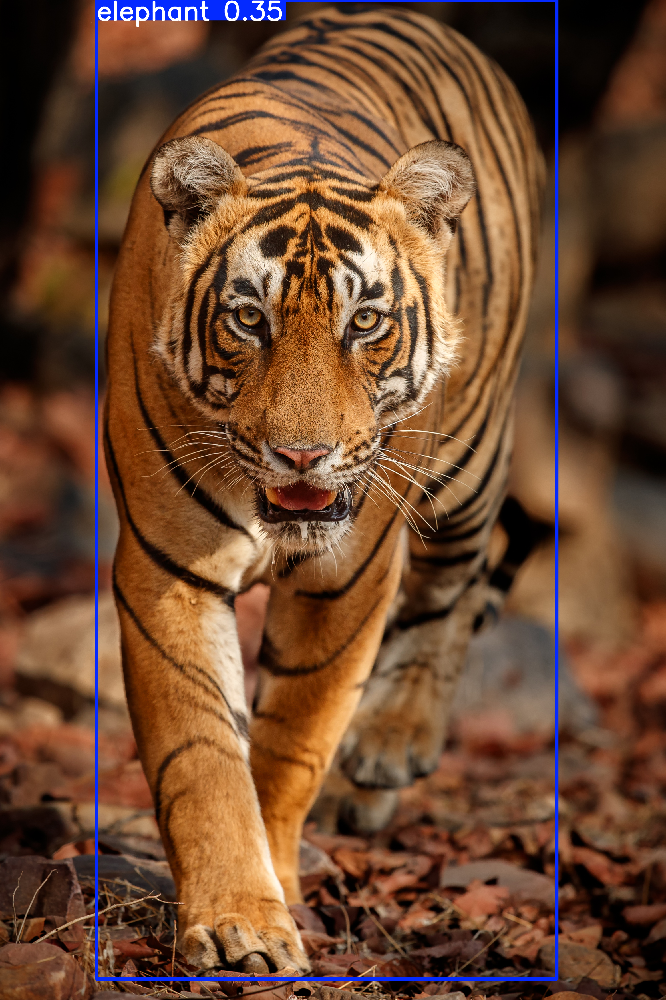

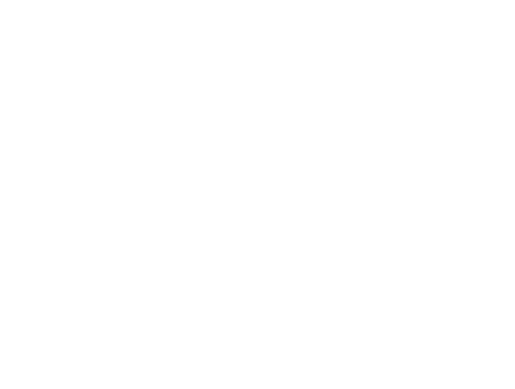

In [9]:
!pip install ultralytics

from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image

# Load pretrained YOLOv8 model
model = YOLO("yolov8n.pt")

# Predict on image
results = model("tiger.jpg")

# Load the image using PIL
img = Image.open("tiger.jpg")
img = img.resize((400, 300))

#plt.imshow(img)
plt.axis("off")
#plt.show()
results[0].show()


Solution:

Load pretrained YOLO model.
Provide image/video input.
Perform object detection.
Display bounding boxes and confidence scores.

2. Preprocessing Image for ResNet Input
Problem: Write a function to preprocess image for pretrained ResNet.


In [11]:
from PIL import Image
from torchvision import transforms

def preprocess_image(image_path):

    image = Image.open(image_path).convert("RGB")

    transform = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.485,0.456,0.406],
            [0.229,0.224,0.225]
        )
    ])

    return transform(image).unsqueeze(0)

input_image = preprocess_image("tiger.jpg")

print("Image Shape:", input_image.shape)

Image Shape: torch.Size([1, 3, 224, 224])


| Code                        | Purpose                            |
| --------------------------- | ---------------------------------- |
| `Image.open("tiger.jpg")`   | Loads the tiger image              |
| `.convert("RGB")`           | Converts image to 3 color channels |
| `Resize((224,224))`         | Resizes image for ResNet input     |
| `ToTensor()`                | Converts image to tensor format    |
| `Normalize()`               | Applies ImageNet normalization     |
| `unsqueeze(0)`              | Adds batch dimension               |
| `torch.Size([1,3,224,224])` | Final shape expected by ResNet     |

========

Pretrained ResNet models are trained on ImageNet images of size 224×224, so input images must be resized to the same dimensions for correct feature extraction and prediction

3. CNN for CIFAR-10 Classification
Problem: Build a CNN model to classify CIFAR-10 images.


In [12]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import Flatten, Dense

# Load CIFAR-10 Dataset
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

# Normalize Images
x_train = x_train / 255.0
x_test = x_test / 255.0

# Build CNN Model
model = Sequential([

    Conv2D(32, (3,3), activation='relu',
           input_shape=(32,32,3)),
    MaxPooling2D((2,2)),

    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D((2,2)),

    Flatten(),

    Dense(128, activation='relu'),

    Dense(10, activation='softmax')
])

# Compile Model
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Train Model
model.fit(
    x_train,
    y_train,
    epochs=5,
    validation_data=(x_test, y_test)
)

# Evaluate Model
loss, accuracy = model.evaluate(x_test, y_test)

print("Test Accuracy:", accuracy)

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 81s 51ms/step - accuracy: 0.4925 - loss: 1.4132 - val_accuracy: 0.5785 - val_loss: 1.2080
Epoch 2/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 78s 49ms/step - accuracy: 0.6276 - loss: 1.0652 - val_accuracy: 0.6484 - val_loss: 1.0061
Epoch 3/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 75s 48ms/step - accuracy: 0.6782 - loss: 0.9257 - val_accuracy: 0.6666 - val_loss: 0.9545
Epoch 4/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 75s 48ms/step - accuracy: 0.7102 - loss: 0.8255 - val_accuracy: 0.6892 - val_loss: 0.9056
Epoch 5/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 79s 51ms/step - accuracy: 0.7395 - loss: 0.7415 - val_accuracy: 0.6828 - val_loss: 0.9234
313/313 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6828 - loss: 0.9234
Test Accuracy: 0.6827999949455261


Where are CIFAR-10 images added in this code?

The images are automatically loaded by this line:

(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
========
What happens here?

| Variable  | Contains                   |
| --------- | -------------------------- |
| `x_train` | 50,000 training images     |
| `y_train` | Labels for training images |
| `x_test`  | 10,000 testing images      |
| `y_test`  | Labels for testing images  |


Solution:

1. Load CIFAR-10 dataset.
2. Normalize image pixel values.
3. Build CNN using Convolution and MaxPooling layers.
4. Flatten extracted features.
5. Add Dense layers for classification.
6. Train and evaluate the model.

| Code                                                       | Purpose                 | Explanation                                     |
| ---------------------------------------------------------- | ----------------------- | ----------------------------------------------- |
| `import tensorflow as tf`                                  | Import TensorFlow       | Deep learning framework used to build CNN.      |
| `from tensorflow.keras.models import Sequential`           | Import Sequential Model | Creates a layer-by-layer neural network.        |
| `from tensorflow.keras.layers import Conv2D, MaxPooling2D` | Import CNN Layers       | Used for feature extraction and pooling.        |
| `from tensorflow.keras.layers import Flatten, Dense`       | Import Layers           | Used for classification.                        |
| `tf.keras.datasets.cifar10.load_data()`                    | Load Dataset            | Loads CIFAR-10 training and testing data.       |
| `x_train = x_train / 255.0`                                | Normalize Training Data | Converts pixel values from 0-255 to 0-1.        |
| `x_test = x_test / 255.0`                                  | Normalize Test Data     | Improves training performance.                  |
| `Sequential([...])`                                        | Create CNN Model        | Defines CNN architecture.                       |
| `Conv2D(32,(3,3),activation='relu',input_shape=(32,32,3))` | Convolution Layer 1     | Extracts basic image features using 32 filters. |
| `MaxPooling2D((2,2))`                                      | Pooling Layer 1         | Reduces image size and computation.             |
| `Conv2D(64,(3,3),activation='relu')`                       | Convolution Layer 2     | Learns deeper image features.                   |
| `MaxPooling2D((2,2))`                                      | Pooling Layer 2         | Further reduces dimensions.                     |
| `Flatten()`                                                | Flatten Layer           | Converts feature maps into a 1D vector.         |
| `Dense(128,activation='relu')`                             | Hidden Layer            | Learns classification patterns.                 |
| `Dense(10,activation='softmax')`                           | Output Layer            | Predicts one of the 10 CIFAR-10 classes.        |
| `model.compile()`                                          | Compile Model           | Configures optimizer, loss, and metrics.        |
| `optimizer='adam'`                                         | Optimizer               | Updates weights efficiently.                    |
| `loss='sparse_categorical_crossentropy'`                   | Loss Function           | Used for multi-class classification.            |
| `metrics=['accuracy']`                                     | Accuracy Metric         | Measures model performance.                     |
| `model.fit()`                                              | Train Model             | Trains the CNN using training data.             |
| `epochs=5`                                                 | Number of Epochs        | Trains for 5 complete cycles.                   |
| `validation_data=(x_test,y_test)`                          | Validation Data         | Evaluates performance during training.          |
| `model.evaluate()`                                         | Test Model              | Measures final test
accuracy.                   |
| `print("Test Accuracy:", accuracy)`                        | Display Accuracy        | Shows model performance.                        |

==========

| Question                                   | Answer                                                    |
| ------------------------------------------ | --------------------------------------------------------- |
| Why use `Conv2D`?                          | To automatically extract image features.                  |
| Why use `MaxPooling2D`?                    | To reduce image dimensions and computation.               |
| Why use `Flatten()`?                       | To convert feature maps into a vector for Dense layers.   |
| Why use `Softmax`?                         | To generate probabilities for 10 classes.                 |
| Why use `sparse_categorical_crossentropy`? | Because CIFAR-10 is a multi-class classification problem. |

===========

CIFAR-10 is a benchmark image classification dataset containing 60,000 RGB images of size 32×32 pixels divided into 10 classes: Airplane, Automobile, Bird, Cat, Deer, Dog, Frog, Horse, Ship, and Truck. It is commonly used for training and evaluating CNN models.

======

Why is CIFAR-10 Important?

The CIFAR datasets were created by researchers at the Canadian Institute For Advanced Research (CIFAR).

| Reason                     | Explanation                           |
| -------------------------- | ------------------------------------- |
| Beginner Friendly          | Small dataset for learning CNNs       |
| Fast Training              | Images are only 32×32 pixels          |
| Multi-Class Classification | Contains 10 different categories      |
| Standard Benchmark         | Widely used in deep learning research |



Custom Transfer Learning with Frozen + Trainable Layers
===

Problem: Load a pretrained MobileNetV2 model, freeze base layers, add custom classifier, and fine-tune the top few layers.


In [34]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Load Pretrained MobileNetV2
base_model = MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

# Freeze Base Layers
for layer in base_model.layers:
    layer.trainable = False

# Add Custom Layers
x = base_model.output

x = GlobalAveragePooling2D()(x)

x = Dense(
    128,
    activation='relu'
)(x)

x = Dropout(0.5)(x)

predictions = Dense(
    2,
    activation='softmax'
)(x)

# Final Model
model = Model(
    inputs=base_model.input,
    outputs=predictions
)

# Compile Model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,422,210 (9.24 MB)

 Trainable params: 164,226 (641.51 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [35]:
# Unfreeze Top 20 Layers
for layer in base_model.layers[-20:]:
    layer.trainable = True

# Recompile Model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("Fine-tuning Enabled")

Fine-tuning Enabled


| Code                       | Purpose                           |
| -------------------------- | --------------------------------- |
| `MobileNetV2()`            | Load pretrained model             |
| `weights='imagenet'`       | Use ImageNet learned features     |
| `include_top=False`        | Remove original classifier        |
| `layer.trainable=False`    | Freeze pretrained layers          |
| `GlobalAveragePooling2D()` | Convert feature maps to vector    |
| `Dense(128)`               | Custom hidden layer               |
| `Dropout(0.5)`             | Reduce overfitting                |
| `Dense(2, softmax)`        | Cat vs Dog output layer           |
| `layer.trainable=True`     | Unfreeze top layers               |
| `Adam(0.0001)`             | Low learning rate for fine-tuning |

========

Transfer Learning with MobileNetV2 uses pretrained ImageNet features, freezes base layers, adds a custom Cat vs Dog classifier, and fine-tunes the top layers for improved accuracy.